# Minecraft Text-Action Dataset

[Датасет](https://huggingface.co/datasets/CraftJarvis/minecraft-text-action-dataset)

Для экономии времени и памяти не будем загружать весь датасет, а посмотрим на него в режиме стриминга

In [3]:
from datasets import load_dataset

ds = load_dataset("CraftJarvis/minecraft-text-action-dataset", split="valid", streaming=True)
print(ds.features) 
row = next(iter(ds))


Resolving data files:   0%|          | 0/363 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/363 [00:00<?, ?it/s]

{'id': Value('string'), 'label': List(Value('string')), 'image': List({'image_path': Value('string'), 'resolution': List(Value('int64'))}), 'conversations': List({'role': Value('string'), 'content': List({'type': Value('string'), 'text': Value('string')})}), 'image_bytes': List(Value('binary'))}


In [4]:
print(row)
for key in row:
    print(key, ",", "type: ", type(row[key]))

{'id': 'Player868-f153ac423f61-20210624-200613-3160', 'label': ['text_action'], 'image': [{'image_path': '/DATA/datasets/minecraft-trajectory.cache/images/Player868-f153ac423f61-20210624-200613/Player868-f153ac423f61-20210624-200613-3160.jpg', 'resolution': [644, 364]}, {'image_path': '/DATA/datasets/minecraft-trajectory.cache/images/Player868-f153ac423f61-20210624-200613/Player868-f153ac423f61-20210624-200613-3161.jpg', 'resolution': [644, 364]}, {'image_path': '/DATA/datasets/minecraft-trajectory.cache/images/Player868-f153ac423f61-20210624-200613/Player868-f153ac423f61-20210624-200613-3162.jpg', 'resolution': [644, 364]}, {'image_path': '/DATA/datasets/minecraft-trajectory.cache/images/Player868-f153ac423f61-20210624-200613/Player868-f153ac423f61-20210624-200613-3163.jpg', 'resolution': [644, 364]}], 'conversations': [{'role': 'user', 'content': [{'type': 'text', 'text': "You are an AI agent performing tasks in Minecraft based on given instructions, action history, and visual observ

Здесь не так уж много полей, как в других датасетах

## Идентификатор

In [5]:
id = row['id']
print(id)

Player868-f153ac423f61-20210624-200613-3160


Просто сгенерированная идентификаторы примеров, в датасете есть ещё такие варианты:

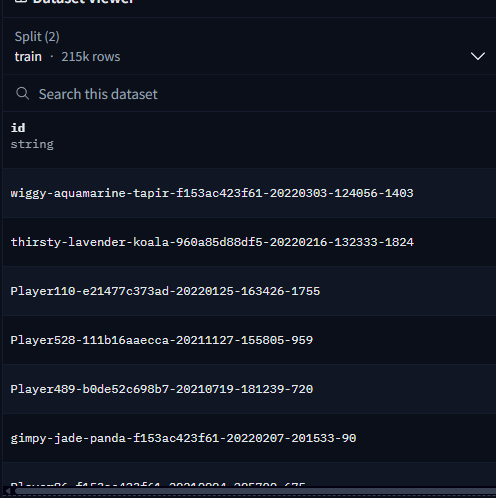

Скорее всего это данные сконвертированы из contractor датасета от openai для VPT

## Лейбл

In [7]:
label = row['label']
print(label)

['text_action']


Посмотрим на уникальные значения этого поля через sql запрос на сайте датасета, используем такой запрос:

```
    SELECT DISTINCT label from valid;
```

Результат:

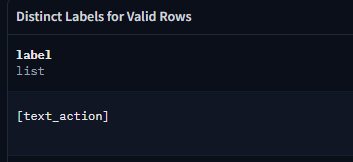

## Изображение

Тут есть два поля: image и image_bytes

In [10]:
image_info = row['image']

for el in image_info:
    print(el)

{'image_path': '/DATA/datasets/minecraft-trajectory.cache/images/Player868-f153ac423f61-20210624-200613/Player868-f153ac423f61-20210624-200613-3160.jpg', 'resolution': [644, 364]}
{'image_path': '/DATA/datasets/minecraft-trajectory.cache/images/Player868-f153ac423f61-20210624-200613/Player868-f153ac423f61-20210624-200613-3161.jpg', 'resolution': [644, 364]}
{'image_path': '/DATA/datasets/minecraft-trajectory.cache/images/Player868-f153ac423f61-20210624-200613/Player868-f153ac423f61-20210624-200613-3162.jpg', 'resolution': [644, 364]}
{'image_path': '/DATA/datasets/minecraft-trajectory.cache/images/Player868-f153ac423f61-20210624-200613/Player868-f153ac423f61-20210624-200613-3163.jpg', 'resolution': [644, 364]}


То есть тут хранится информация о четырёх изображениях. Судя по нумерации эти изображения последовательны

In [13]:
image_bytes = row['image_bytes']
print(len(image_bytes))

4


Имеем четыре изображения

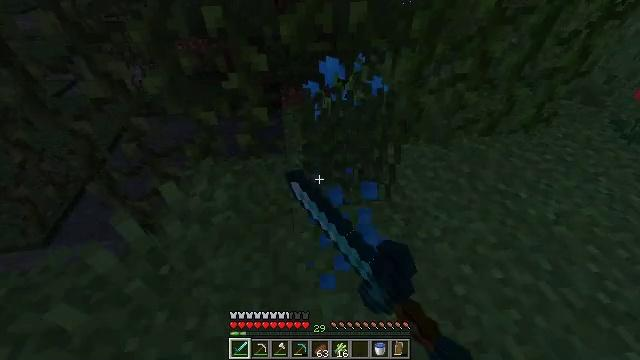

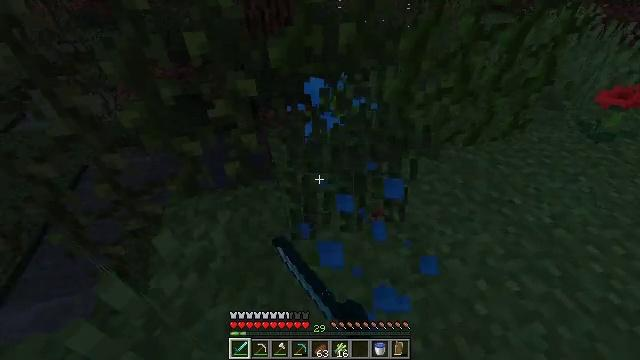

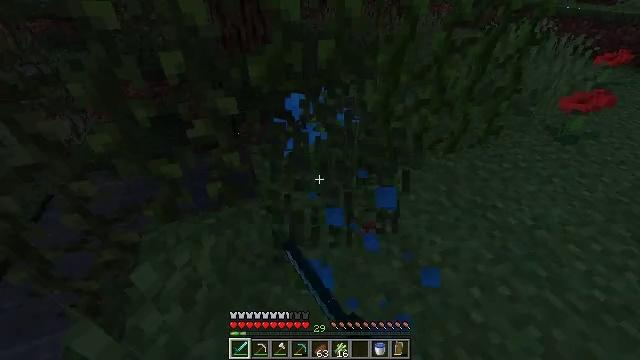

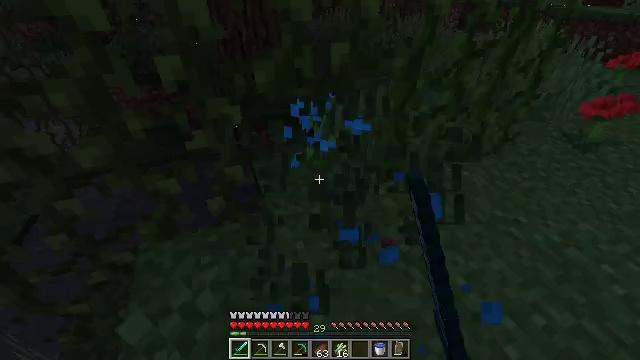

In [14]:
from PIL import Image
from io import BytesIO

for bytes in image_bytes:
    img = Image.open(BytesIO(bytes))
    img.show()

Вот эти четыре последовательных кадра

## Диалоги

In [18]:
import json

conversations = row["conversations"]

print(json.dumps(conversations, indent=2, ensure_ascii=False))


[
  {
    "role": "user",
    "content": [
      {
        "type": "text",
        "text": "You are an AI agent performing tasks in Minecraft based on given instructions, action history, and visual observations (screenshots). Your goal is to take the optimal action to complete the task.\n\n## Output Format\nAction: ... \n\n## Action Space\n* move('dx', 'dy') # Move the mouse position; dx and dy represent horizontal and vertical movement, respectively.\n* click('left' or 'right')) # left click or right click the mouse\n    - left_click # Attack; In GUI, pick up the stack of items or place the stack of items in a GUI cell; when used as a double click (attack - no attack - attack sequence), collect all items of the same kind present in inventory as a single stack.\n    - right_click # Place the item currently held or use the block the player is looking at. In GUI, pick up the stack of items or place a single item from a stack held by mouse.\n* press(keys) # press the keyboard buttons\n   

То есть здесь задаётся начальный промпт для модели, чтобы она выполняла задачу, ей загружается история действий и наблюдений (скриншоты), потом даётся задача и текущее изображение, затем модель выполняет действие, наблюдение обновляется, выбирается новое действие и так далее

Интересно, везде ли даётся по 4 изображения, проверим на следующих примерах

In [19]:
from collections import Counter

lengths = Counter()

for i, row in enumerate(ds):
    if i >= 20:
        break
    l = len(row["image"])
    lengths[l] += 1
    print(f"row {i}: len(image) = {l}")

print("summary:", lengths)


row 0: len(image) = 4
row 1: len(image) = 30
row 2: len(image) = 30
row 3: len(image) = 30
row 4: len(image) = 30
row 5: len(image) = 30
row 6: len(image) = 25
row 7: len(image) = 30
row 8: len(image) = 30
row 9: len(image) = 30
row 10: len(image) = 30
row 11: len(image) = 30
row 12: len(image) = 30
row 13: len(image) = 30
row 14: len(image) = 30
row 15: len(image) = 30
row 16: len(image) = 30
row 17: len(image) = 30
row 18: len(image) = 30
row 19: len(image) = 30
summary: Counter({30: 18, 4: 1, 25: 1})


То есть необязательно по 4 изображения, где-то может быть более долгая задача

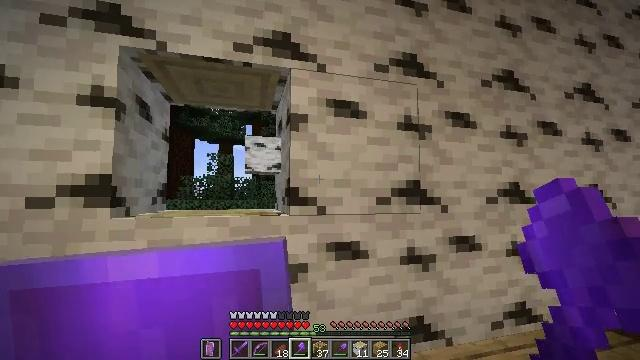

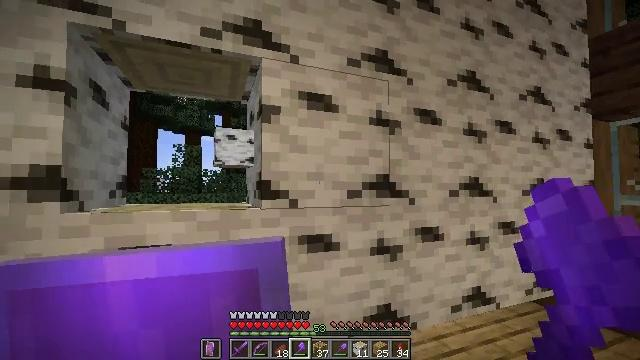

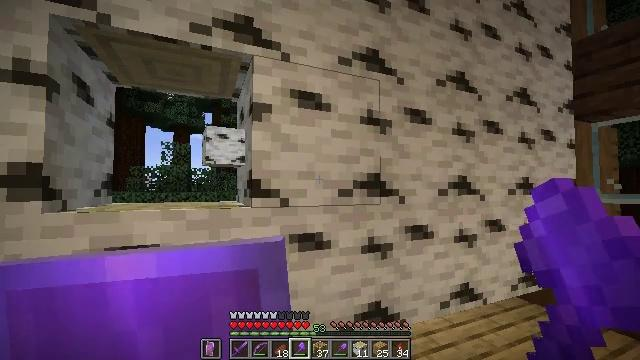

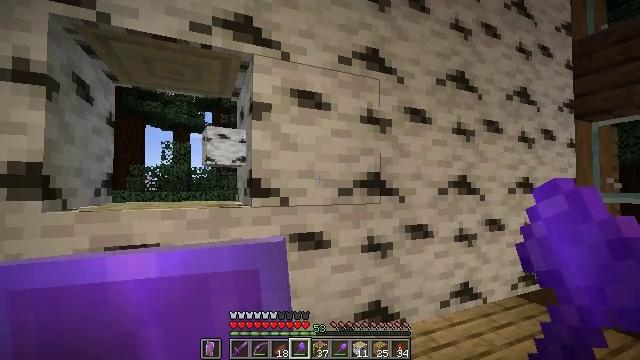

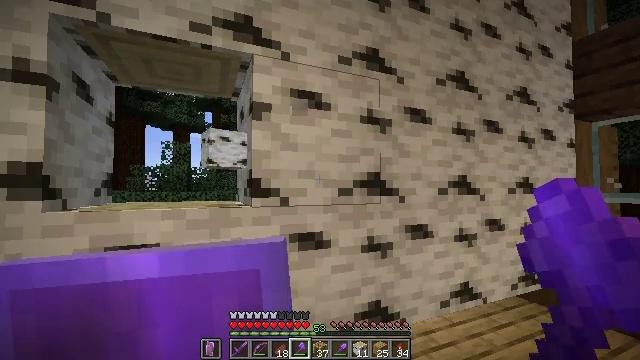

...

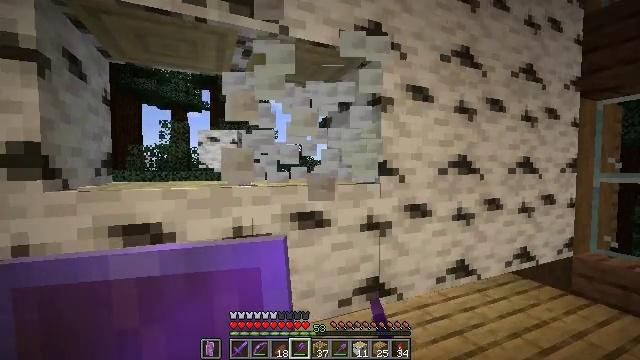

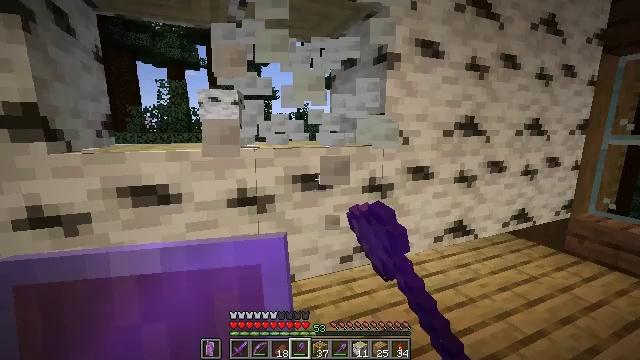

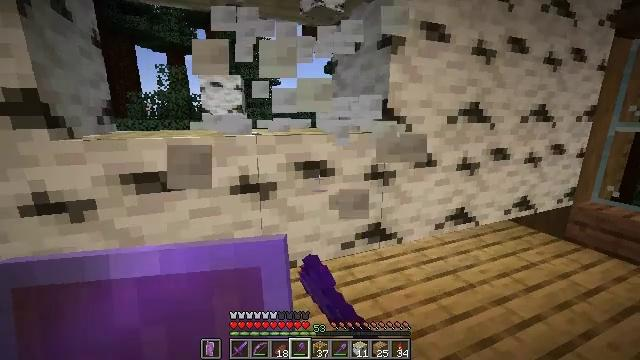

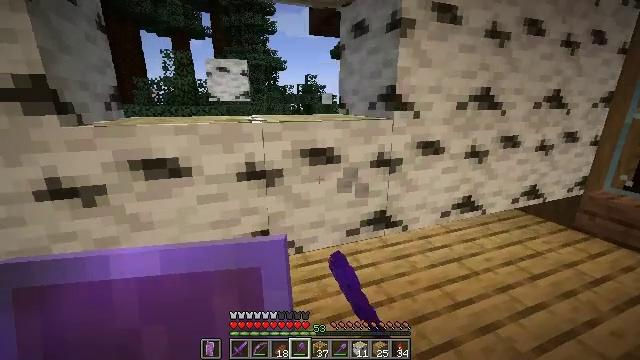

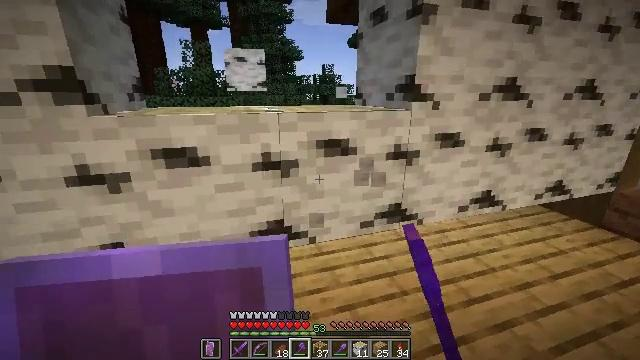

In [20]:
image_bytes = row['image_bytes']
for bytes in image_bytes:
    img = Image.open(BytesIO(bytes))
    img.show()

In [21]:
conversations = row["conversations"]

print(json.dumps(conversations, indent=2, ensure_ascii=False))

[
  {
    "role": "user",
    "content": [
      {
        "type": "text",
        "text": "You are an AI agent performing tasks in Minecraft based on given instructions, action history, and visual observations (screenshots). Your goal is to take the optimal action to complete the task.\n\n## Output Format\nAction: ... \n\n## Action Space\n* move('dx', 'dy') # Move the mouse position; dx and dy represent horizontal and vertical movement, respectively.\n* click('left' or 'right')) # left click or right click the mouse\n    - left_click # Attack; In GUI, pick up the stack of items or place the stack of items in a GUI cell; when used as a double click (attack - no attack - attack sequence), collect all items of the same kind present in inventory as a single stack.\n    - right_click # Place the item currently held or use the block the player is looking at. In GUI, pick up the stack of items or place a single item from a stack held by mouse.\n* press(keys) # press the keyboard buttons\n   

Всё зависит от продолжительности действия и задачи

## Выводы

Датасет подходящий для обучения VLA модели в формате того, что мы даём ей текстовую инструкцию и контекст. Каждая строка уже представляет из себя короткий эпизод. Причём модель выдаёт действия в виде клавиш и смещений для камеры. Такой вывод должен сработать с окружением, которое устроено в MineStudio. В теории хороший датасет для обучения модели в стиле клонирования поведения, только для обучения нужно обработать данные и оформить их в виде последовательности.